In [3]:
# Compute the SSIM between two images.

from skimage.metrics import structural_similarity as ssim
import cv2
import sys
import numpy as np

def compute_ssim(img1, img2):
    img1 = cv2.imread(img1)
    img2 = cv2.imread(img2)
    img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
    return ssim(img1, img2)


In [4]:
import os
import pandas as pd
reference_image_path = "out/GT/rendered_image_BMC_IS_150_GP_10_samples.png"
results_path = 'out/Results'

# Number of methods is the number of folders in the results path
number_of_methods = len([name for name in os.listdir(results_path) if os.path.isdir(os.path.join(results_path, name))])

# Number of samples is the number of images in the first method 
first_method_path = sorted(os.listdir(results_path))[0]
number_of_samples = len(os.listdir(os.path.join(results_path, first_method_path))) // 3

print("Number of methods: ", number_of_methods)
print("Number of samples: ", number_of_samples)

samples_values = [5, 20]

df = pd.DataFrame(columns=['Method', 'Samples', 'SSIM'])

for i, method in enumerate(sorted(os.listdir(results_path))):
    method_path = os.path.join(results_path, method)
    image_list = [image for image in os.listdir(method_path) if image.endswith('.png')]
    for j, image in enumerate(sorted(image_list)):
            print("Computing SSIM", os.path.join(method_path, image))
            # Get the samples value using hte first number of the image name 
            # First divide the image name by the underscore
            image_name = image.split('_')
            # Get the first number
            for string in image_name:
                if string.isdigit():
                    samples = int(string)
                    break
            print("Samples: ", samples)
            sim = compute_ssim(reference_image_path, os.path.join(method_path, image))
            df = df.append({'Method': method, 'Samples': samples, 'SSIM': sim}, ignore_index=True)

Number of methods:  4
Number of samples:  2
Computing SSIM out/Results/BMC/rendered_image_BMC_20_GP_5_samples.png
Samples:  20
Computing SSIM out/Results/BMC/rendered_image_BMC_5_GP_5_samples.png
Samples:  5
Computing SSIM out/Results/BMC_IS/rendered_image_BMC_IS_20_GP_5_samples.png
Samples:  20
Computing SSIM out/Results/BMC_IS/rendered_image_BMC_IS_5_GP_5_samples.png
Samples:  5
Computing SSIM out/Results/MC/rendered_image_MC_20_samples.png
Samples:  20
Computing SSIM out/Results/MC/rendered_image_MC_5_samples.png
Samples:  5
Computing SSIM out/Results/MC_IS/rendered_image_MC_IS_20_samples.png
Samples:  20
Computing SSIM out/Results/MC_IS/rendered_image_MC_IS_5_samples.png
Samples:  5


In [5]:
# Pivot the table
pivot_df = df.pivot(index='Samples', columns='Method', values='SSIM')
# Change the order of the columns 
correct_order = ['MC', 'MC_IS', 'BMC', 'BMC_IS']
pivot_df = pivot_df[correct_order]
# round the values
pivot_df = pivot_df.round(4)
pivot_df

Method,MC,MC_IS,BMC,BMC_IS
Samples,,,,
5,0.3928,0.3963,0.3904,0.3988
20,0.5070,0.5391,0.5513,0.6083


Plotting out/Results/BMC/rendered_image_BMC_20_GP_5_samples.png
Samples:  20
Plotting out/Results/BMC/rendered_image_BMC_5_GP_5_samples.png
Samples:  5
Plotting out/Results/BMC_IS/rendered_image_BMC_IS_20_GP_5_samples.png
Samples:  20
Plotting out/Results/BMC_IS/rendered_image_BMC_IS_5_GP_5_samples.png
Samples:  5
Plotting out/Results/MC/rendered_image_MC_20_samples.png
Samples:  20
Plotting out/Results/MC/rendered_image_MC_5_samples.png
Samples:  5
Plotting out/Results/MC_IS/rendered_image_MC_IS_20_samples.png
Samples:  20
Plotting out/Results/MC_IS/rendered_image_MC_IS_5_samples.png
Samples:  5


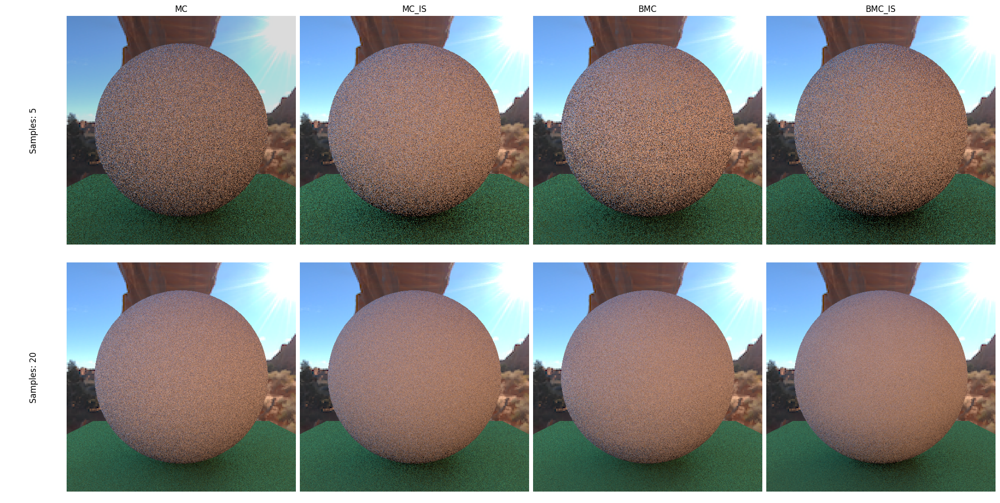

In [6]:
import os
import cv2
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

# Assuming the following dictionaries are defined
number_of_samples = 2  # Example: 2 sample values (5 and 20)
number_of_methods = 4  # Example: 4 methods ('MC', 'MC_IS', 'BMC', 'BMC_IS')
map_ax_to_method = {'MC': 0, 'MC_IS': 1, 'BMC': 2, 'BMC_IS': 3}
map_ax_to_sample = {5: 0, 20: 1}

# Create figure and GridSpec object
fig = plt.figure(figsize=(20, 10), dpi=100, constrained_layout=True)
gs = GridSpec(nrows=number_of_samples, ncols=number_of_methods + 1, width_ratios=[1, 4, 4, 4, 4], figure=fig)

# Create axis objects with subplots() using the gridspec
ax = [[fig.add_subplot(gs[row, col]) for col in range(number_of_methods + 1)] for row in range(number_of_samples)]

# Remove the axis for the sample labels column
for row in range(number_of_samples):
    ax[row][0].axis('off')

for i, method in enumerate(sorted(os.listdir(results_path))):
    method_path = os.path.join(results_path, method)
    image_list = [image for image in os.listdir(method_path) if image.endswith('.png')]
    for j, image in enumerate(sorted(image_list)):
        path = os.path.join(method_path, image)
        print("Plotting", path)
        # Get the samples value using the first number of the image name 
        image_name = image.split('_')
        for string in image_name:
            if string.isdigit():
                samples = int(string)
                break
        print("Samples: ", samples)
        
    
        img = cv2.imread(path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        correct_i = map_ax_to_method[method]
        correct_j = map_ax_to_sample[samples]
        ax[correct_j][correct_i + 1].imshow(img)
        ax[correct_j][correct_i + 1].axis('off')
        
    # Add the method name to the first row
    ax[0][map_ax_to_method[method] + 1].set_title(method)

# Add the sample values to the first column as row labels
for samples, row_index in map_ax_to_sample.items():
    fig.add_subplot(ax[row_index][0]).text(0.5, 0.5, f"Samples: {samples}", ha='center', va='center', rotation=90, fontsize=12)

plt.show()


Plotting out/Results/BMC/rendered_image_BMC_20_GP_5_samples.png
Samples:  20
Plotting out/Results/BMC/rendered_image_BMC_5_GP_5_samples.png
Samples:  5
Plotting out/Results/BMC_IS/rendered_image_BMC_IS_20_GP_5_samples.png
Samples:  20
Plotting out/Results/BMC_IS/rendered_image_BMC_IS_5_GP_5_samples.png
Samples:  5
Plotting out/Results/MC/rendered_image_MC_20_samples.png
Samples:  20
Plotting out/Results/MC/rendered_image_MC_5_samples.png
Samples:  5
Plotting out/Results/MC_IS/rendered_image_MC_IS_20_samples.png
Samples:  20
Plotting out/Results/MC_IS/rendered_image_MC_IS_5_samples.png
Samples:  5


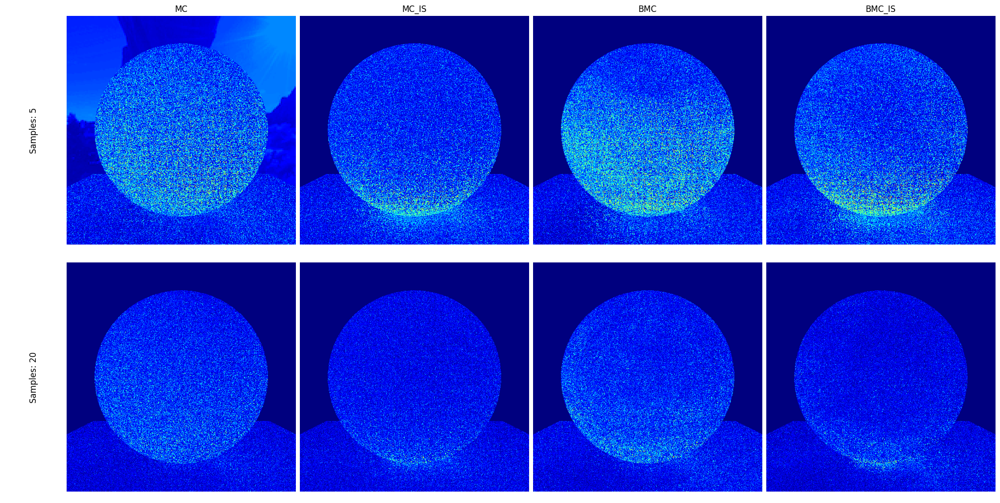

In [7]:
import os
import cv2
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec


reference_image = cv2.imread(reference_image_path)
reference_image = cv2.cvtColor(reference_image, cv2.COLOR_BGR2RGB)


# Assuming the following dictionaries are defined
number_of_samples = 2  # Example: 2 sample values (5 and 20)
number_of_methods = 4  # Example: 4 methods ('MC', 'MC_IS', 'BMC', 'BMC_IS')
map_ax_to_method = {'MC': 0, 'MC_IS': 1, 'BMC': 2, 'BMC_IS': 3}
map_ax_to_sample = {5: 0, 20: 1}

# Create figure and GridSpec object
fig = plt.figure(figsize=(20, 10), dpi=100, constrained_layout=True)
gs = GridSpec(nrows=number_of_samples, ncols=number_of_methods + 1, width_ratios=[1, 4, 4, 4, 4], figure=fig)

# Create axis objects with subplots() using the gridspec
ax = [[fig.add_subplot(gs[row, col]) for col in range(number_of_methods + 1)] for row in range(number_of_samples)]

# Remove the axis for the sample labels column
for row in range(number_of_samples):
    ax[row][0].axis('off')

for i, method in enumerate(sorted(os.listdir(results_path))):
    method_path = os.path.join(results_path, method)
    image_list = [image for image in os.listdir(method_path) if image.endswith('.png')]
    for j, image in enumerate(sorted(image_list)):
        path = os.path.join(method_path, image)
        print("Plotting", path)
        # Get the samples value using the first number of the image name 
        image_name = image.split('_')
        for string in image_name:
            if string.isdigit():
                samples = int(string)
                break
        print("Samples: ", samples)
        
        
        img = cv2.imread(path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        # Compute the error (MAE) between the current image and the reference image to get a heatmap
        error = cv2.absdiff(reference_image, img)
        # Normalize the error image to be in the range [0, 1]
        error = cv2.normalize(error, None, 0, 1, cv2.NORM_MINMAX, cv2.CV_32F)
        error = cv2.cvtColor(error, cv2.COLOR_RGB2GRAY)
                
        
        
        
        correct_i = map_ax_to_method[method]
        correct_j = map_ax_to_sample[samples]
        
        
        ax[correct_j][correct_i + 1].imshow(error, cmap='jet')
        ax[correct_j][correct_i + 1].axis('off')
        
    # Add the method name to the first row
    ax[0][map_ax_to_method[method] + 1].set_title(method)

# Add the sample values to the first column as row labels
for samples, row_index in map_ax_to_sample.items():
    fig.add_subplot(ax[row_index][0]).text(0.5, 0.5, f"Samples: {samples}", ha='center', va='center', rotation=90, fontsize=12)

plt.show()



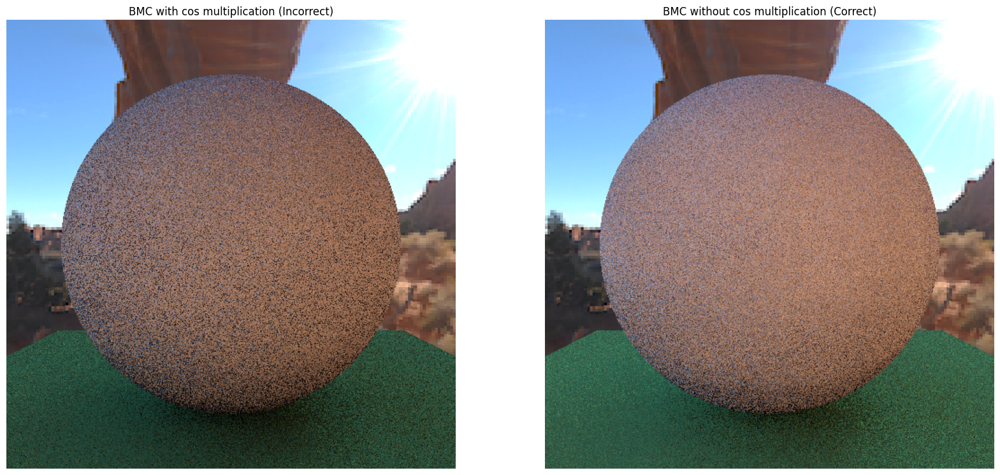

In [11]:
img1_path = 'out/AssignmentLast/cosVSnocos/rendered_image_BMC_10_GP_5_samples.png' 
img2_path = 'out/AssignmentLast/cosVSnocos/rendered_image_BMCnocos_10_GP_5_samples.png'

# Plot the images in a 1x2 grid 
fig, ax = plt.subplots(1, 2, figsize=(20, 10))
img1 = cv2.imread(img1_path)
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2 = cv2.imread(img2_path)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
ax[0].imshow(img1)
ax[0].axis('off')
ax[0].set_title('BMC with cos multiplication (Incorrect)')
ax[1].imshow(img2)
ax[1].axis('off')
ax[1].set_title('BMC without cos multiplication (Correct)')
plt.show()

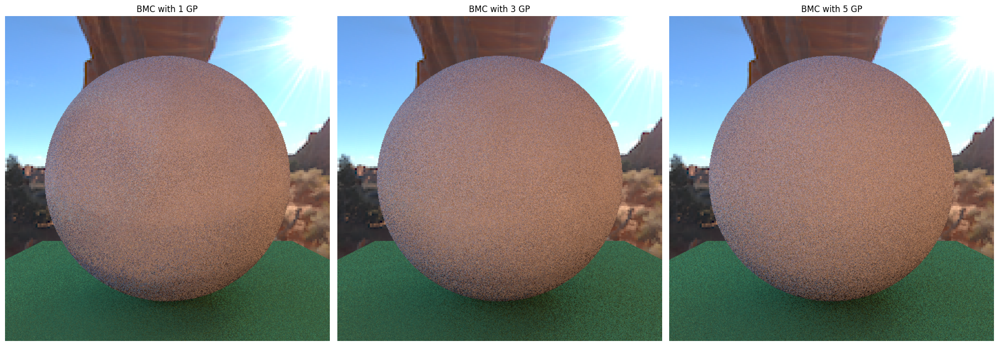

In [15]:
img1_path = 'out/rendered_image_BMC_20_GP_1_samples.png' 
img2_path = 'out/rendered_image_BMC_20_GP_3_samples.png'
img3_path = 'out/Results/BMC/rendered_image_BMC_20_GP_5_samples.png'

# Plot the images in a 1x3 grid 
fig, ax = plt.subplots(1, 3, figsize=(20, 10))
img1 = cv2.imread(img1_path)
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2 = cv2.imread(img2_path)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
img3 = cv2.imread(img3_path)
img3 = cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)
ax[0].imshow(img1)
ax[0].axis('off')
ax[0].set_title('BMC with 1 GP')
ax[1].imshow(img2)
ax[1].axis('off')
ax[1].set_title('BMC with 3 GP')
ax[2].imshow(img3)
ax[2].axis('off')
ax[2].set_title('BMC with 5 GP')
plt.tight_layout()
plt.show()

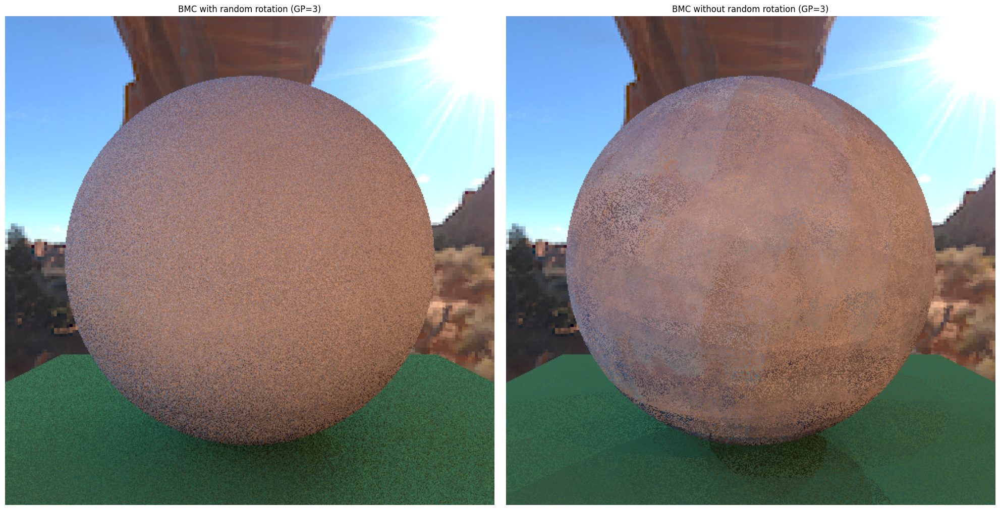

In [18]:
# Using the rotation or not
img1_path = 'out/rendered_image_BMC_20_GP_3_samples.png'
img2_path = 'out/rendered_image_BMCnorot_20_GP_3_samples.png'

# Plot the images in a 1x2 grid
fig, ax = plt.subplots(1, 2, figsize=(20, 10))
img1 = cv2.imread(img1_path)
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2 = cv2.imread(img2_path)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
ax[0].imshow(img1)
ax[0].axis('off')
ax[0].set_title('BMC with random rotation (GP=3)')
ax[1].imshow(img2)
ax[1].axis('off')
ax[1].set_title('BMC without random rotation (GP=3)')
plt.tight_layout()
plt.show()







